In [113]:
%matplotlib inline

import pandas as pd
import numpy as np

from dash import Dash, html, dcc
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=False)

from typing import *

app = Dash(__name__)

PLOTLY_THEME = "plotly_white"
EXPORT_DIR = "image_out"
MAIN_DATA = "data.csv"

import os

if not os.path.exists(EXPORT_DIR):
    os.mkdir(EXPORT_DIR)

In [114]:
if not os.path.exists(MAIN_DATA):
    # Auto download from pre-computed Nextcloud server
    import requests
    r = requests.get("https://next.jmw.nz/s/L7drTr5wLqs67Te/download")
    with open(MAIN_DATA, "wb") as f:
        f.write(r.content)

In [115]:
power_sources = pd.read_csv("power_sources.csv", header=None)
power_sources.columns = ["source_id","source","ci-co2-per-kwh"]
power_sources

,source_id,source,ci-co2-per-kwh
0,1,battery,8
1,2,co_gen,249
2,3,gas,410
3,4,coal,1073
4,5,hydro,8
5,6,geothermal,90
6,8,wind,7
7,7,diesel,850


In [116]:
data_raw = pd.read_csv("data.csv", index_col=0)

# Convert reading_timestamp to datetime
data_raw["reading_timestamp"] = pd.to_datetime(data_raw["reading_timestamp"])

data_raw.loc[data_raw["source_id"]==5].tail(16)

,source_id,generation,capacity,reading_timestamp
id,,,,
81676,5,3182,5415,2023-04-20 19:00:00+00:00
81684,5,3493,5415,2023-04-20 19:30:00+00:00
81692,5,3695,5415,2023-04-20 20:00:00+00:00
81700,5,3785,5415,2023-04-20 20:30:00+00:00
81708,5,3837,5415,2023-04-20 21:00:00+00:00
81716,5,3803,5415,2023-04-20 21:30:00+00:00
81724,5,3747,5415,2023-04-20 22:00:00+00:00
81732,5,3736,5415,2023-04-20 22:30:00+00:00
81740,5,3724,5415,2023-04-20 23:00:00+00:00


In [117]:
data_raw = data_raw.merge(power_sources)
data_raw

,source_id,generation,capacity,reading_timestamp,source,ci-co2-per-kwh
0,1,0,1,2022-08-20 02:30:00+00:00,battery,8
1,1,0,1,2022-08-20 03:00:00+00:00,battery,8
2,1,0,1,2022-08-20 03:30:00+00:00,battery,8
3,1,0,1,2022-08-20 04:00:00+00:00,battery,8
4,1,0,1,2022-08-20 04:30:00+00:00,battery,8
...,...,...,...,...,...,...
81627,8,52,1040,2023-04-21 00:30:00+00:00,wind,7
81628,8,60,1040,2023-04-21 01:00:00+00:00,wind,7
81629,8,57,1040,2023-04-21 01:30:00+00:00,wind,7
81630,8,48,1040,2023-04-21 02:00:00+00:00,wind,7


In [118]:
# Flatten data structure, it now has 16 columns
# 	id	source_id	generation	capacity	reading_timestamp\
# Transform so each of the 8 source_id's are in their own column with their generation and capacity
# Group the source ID's by their reading timestamp
generation_logs = data_raw.pivot_table(index=["reading_timestamp"], columns="source", values=["generation","ci-co2-per-kwh"]).reset_index()
generation_logs

reading_timestamp ci-co2-per-kwh                           \
source                                  battery co_gen  coal diesel  gas   
0      2022-08-20 02:00:00+00:00              8    249  1073    850  410   
1      2022-08-20 02:30:00+00:00              8    249  1073    850  410   
2      2022-08-20 03:00:00+00:00              8    249  1073    850  410   
3      2022-08-20 03:30:00+00:00              8    249  1073    850  410   
4      2022-08-20 04:00:00+00:00              8    249  1073    850  410   
...                          ...            ...    ...   ...    ...  ...   
10199  2023-04-21 00:00:00+00:00              8    249  1073    850  410   
10200  2023-04-21 00:30:00+00:00              8    249  1073    850  410   
10201  2023-04-21 01:00:00+00:00              8    249  1073    850  410   
10202  2023-04-21 01:30:00+00:00              8    249  1073    850  410   
10203  2023-04-21 02:00:00+00:00              8    249  1073    850  410   

                             generation                                     \
source geothermal hydro wind    battery co_gen coal diesel  gas geothermal   
0              90     8    7          0    109    0      0  201        923   
1              90     8    7          0     99    0      0  202        924   
2              90     8    7          0     87    0      0  221        923   
3              90     8    7          0     86    0      0  221        924   
4              90     8    7          0    101    0      0  251        924   
...           ...   ...  ...        ...    ...  ...    ...  ...        ...   
10199          90     8    7          0     95  178      0  434        782   
10200          90     8    7          0     93  178      0  432        784   
10201          90     8    7          0     94  164      0  432        783   
10202          90     8    7          0     96  160      0  427        783   
10203          90     8    7          0     94  158      0  431        785   

                   
source hydro wind  
0       2783  616  
1       2829  567  
2       2899  531  
3       2926  537  
4       2942  536  
...      ...  ...  
10199   3701   58  
10200   3682   52  
10201   3663   60  
10202   3631   57  
10203   3624   48  

[10204 rows x 17 columns]

In [119]:
SUBSET_LENGTH = len(generation_logs)
generation_subset = generation_logs.tail(SUBSET_LENGTH)
generation_subset

reading_timestamp ci-co2-per-kwh                           \
source                                  battery co_gen  coal diesel  gas   
0      2022-08-20 02:00:00+00:00              8    249  1073    850  410   
1      2022-08-20 02:30:00+00:00              8    249  1073    850  410   
2      2022-08-20 03:00:00+00:00              8    249  1073    850  410   
3      2022-08-20 03:30:00+00:00              8    249  1073    850  410   
4      2022-08-20 04:00:00+00:00              8    249  1073    850  410   
...                          ...            ...    ...   ...    ...  ...   
10199  2023-04-21 00:00:00+00:00              8    249  1073    850  410   
10200  2023-04-21 00:30:00+00:00              8    249  1073    850  410   
10201  2023-04-21 01:00:00+00:00              8    249  1073    850  410   
10202  2023-04-21 01:30:00+00:00              8    249  1073    850  410   
10203  2023-04-21 02:00:00+00:00              8    249  1073    850  410   

                             generation                                     \
source geothermal hydro wind    battery co_gen coal diesel  gas geothermal   
0              90     8    7          0    109    0      0  201        923   
1              90     8    7          0     99    0      0  202        924   
2              90     8    7          0     87    0      0  221        923   
3              90     8    7          0     86    0      0  221        924   
4              90     8    7          0    101    0      0  251        924   
...           ...   ...  ...        ...    ...  ...    ...  ...        ...   
10199          90     8    7          0     95  178      0  434        782   
10200          90     8    7          0     93  178      0  432        784   
10201          90     8    7          0     94  164      0  432        783   
10202          90     8    7          0     96  160      0  427        783   
10203          90     8    7          0     94  158      0  431        785   

                   
source hydro wind  
0       2783  616  
1       2829  567  
2       2899  531  
3       2926  537  
4       2942  536  
...      ...  ...  
10199   3701   58  
10200   3682   52  
10201   3663   60  
10202   3631   57  
10203   3624   48  

[10204 rows x 17 columns]

In [120]:


fig = px.line(x=generation_subset["reading_timestamp"], y=generation_subset[("generation","hydro")], title="Hydro Generation", markers=True, range_y=[0, max(generation_subset["generation"]["hydro"])])
fig.show()

# Calculate carbon intensity
> Data from https://ecotricity.co.nz/the-truth-behind-new-zealand-s-electricity-emissions and https://www.researchgate.net/publication/235458666_Estimation_of_Carbon_Footprints_from_Diesel_Generator_Emissions


In [121]:
MW_TO_KW = 1000
GRAMS_TO_TONNE = 1/(1000*1000)
scaler = MW_TO_KW*GRAMS_TO_TONNE
co2_generation = (generation_subset["ci-co2-per-kwh"]*generation_subset["generation"])*scaler
co2_generation["reading_timestamp"] = generation_subset["reading_timestamp"]
co2_generation["cumulative_output"] = co2_generation[power_sources["source"]].sum(axis=1)
co2_generation

source,battery,co_gen,coal,diesel,gas,geothermal,hydro,wind,reading_timestamp,cumulative_output
0,0.0,27.141,0.000,0.0,82.41,83.07,22.264,4.312,2022-08-20 02:00:00+00:00,219.197
1,0.0,24.651,0.000,0.0,82.82,83.16,22.632,3.969,2022-08-20 02:30:00+00:00,217.232
2,0.0,21.663,0.000,0.0,90.61,83.07,23.192,3.717,2022-08-20 03:00:00+00:00,222.252
3,0.0,21.414,0.000,0.0,90.61,83.16,23.408,3.759,2022-08-20 03:30:00+00:00,222.351
4,0.0,25.149,0.000,0.0,102.91,83.16,23.536,3.752,2022-08-20 04:00:00+00:00,238.507
...,...,...,...,...,...,...,...,...,...,...
10199,0.0,23.655,190.994,0.0,177.94,70.38,29.608,0.406,2023-04-21 00:00:00+00:00,492.983
10200,0.0,23.157,190.994,0.0,177.12,70.56,29.456,0.364,2023-04-21 00:30:00+00:00,491.651
10201,0.0,23.406,175.972,0.0,177.12,70.47,29.304,0.420,2023-04-21 01:00:00+00:00,476.692
10202,0.0,23.904,171.680,0.0,175.07,70.47,29.048,0.399,2023-04-21 01:30:00+00:00,470.571


In [122]:
fig = make_subplots(
    rows=2, cols=1,
    specs=[[{"type": "scatter"}],[{"type": "heatmap"}]],
    )

In [123]:
import json
json.dumps(list(power_sources["source"]))

'["battery", "co_gen", "gas", "coal", "hydro", "geothermal", "wind", "diesel"]'

In [124]:
order = ["battery", "diesel", "wind", "geothermal", "hydro", "co_gen", "gas", "coal"]
fig = px.area(co2_generation, x="reading_timestamp", y=order, title="CO2e Output per Source", markers=False,labels={
                     "value": "CO2e Output (Tonne/hr)",
                     "reading_timestamp": "Reading Date",

                 },
)
fig.update_xaxes(minor=dict(ticks="outside", showgrid=True))
fig.show()

In [125]:
fig = px.density_heatmap(x=co2_generation["reading_timestamp"], y=[1]*SUBSET_LENGTH, z=co2_generation["cumulative_output"],nbinsx=500, nbinsy=1, height=300, title="Cumulative CO2e Output")
fig.update_xaxes(minor=dict(ticks="outside", showgrid=True))
fig.show()


In [126]:
cum_generation = generation_subset["generation"][power_sources["source"]].sum(axis=1)
co2_intensity = pd.DataFrame()
co2_intensity["intensity"] = (co2_generation["cumulative_output"]/cum_generation)*1000
co2_intensity["reading_timestamp"] = generation_subset["reading_timestamp"]
co2_intensity

,intensity,reading_timestamp
0,47.322323,2022-08-20 02:00:00+00:00
1,47.009738,2022-08-20 02:30:00+00:00
2,47.683330,2022-08-20 03:00:00+00:00
3,47.369195,2022-08-20 03:30:00+00:00
4,50.169752,2022-08-20 04:00:00+00:00
...,...,...
10199,93.937309,2023-04-21 00:00:00+00:00
10200,94.167975,2023-04-21 00:30:00+00:00
10201,91.742109,2023-04-21 01:00:00+00:00
10202,91.302095,2023-04-21 01:30:00+00:00


In [127]:
fig = px.line(co2_intensity, x='reading_timestamp', y="intensity")
fig.show()


# Fit Co2 Range to Distribution

In [128]:
len(co2_intensity)

10204

In [129]:
from scipy import stats
BIN_COUNT = round(len(co2_intensity)/100)
co2_readings_freq = co2_intensity["intensity"].value_counts(bins = BIN_COUNT, normalize=True).sort_index().rename_axis('unique_values').reset_index(name='counts')
co2_readings_freq["avg_value"] = co2_readings_freq["unique_values"].apply(lambda x: x.mid)
co2_readings_freq

,unique_values,counts,avg_value
0,"(20.355, 21.623]",0.001372,20.9890
1,"(21.623, 22.772]",0.002940,22.1975
2,"(22.772, 23.922]",0.004116,23.3470
3,"(23.922, 25.071]",0.007056,24.4965
4,"(25.071, 26.221]",0.008330,25.6460
...,...,...,...
97,"(131.976, 133.126]",0.000294,132.5510
98,"(133.126, 134.275]",0.000098,133.7005
99,"(134.275, 135.425]",0.000196,134.8500
100,"(135.425, 136.574]",0.000000,135.9995


In [130]:
px.histogram(co2_intensity["intensity"],nbins=BIN_COUNT, title="CO2e Intensity Distribution")

  1 / 106: ksone  2 / 106: kstwo

  3 / 106: kstwobign
  4 / 106: norm
  5 / 106: alpha
  6 / 106: anglit
  7 / 106: arcsine
  8 / 106: beta
  9 / 106: betaprime
 10 / 106: bradford
 11 / 106: burr
 12 / 106: burr12
 13 / 106: fisk
 14 / 106: cauchy
 15 / 106: chi
 16 / 106: chi2
 17 / 106: cosine
 18 / 106: dgamma
 19 / 106: dweibull
 20 / 106: expon
 21 / 106: exponnorm
 22 / 106: exponweib
 23 / 106: exponpow
 24 / 106: fatiguelife
 25 / 106: foldcauchy
 26 / 106: f
 27 / 106: foldnorm
 28 / 106: weibull_min
 29 / 106: truncweibull_min
 30 / 106: weibull_max
 31 / 106: genlogistic
 32 / 106: genpareto
 33 / 106: genexpon
 34 / 106: genextreme
 35 / 106: gamma
 36 / 106: erlang
 37 / 106: gengamma
 38 / 106: genhalflogistic
 39 / 106: genhyperbolic
 40 / 106: gompertz
 41 / 106: gumbel_r
 42 / 106: gumbel_l
 43 / 106: halfcauchy
 44 / 106: halflogistic
 45 / 106: halfnorm
 46 / 106: hypsecant
 47 / 106: gausshyper
 48 / 106: invgamma
 49 / 106: invgauss
 50 / 106: geninvgauss
 51 / 1

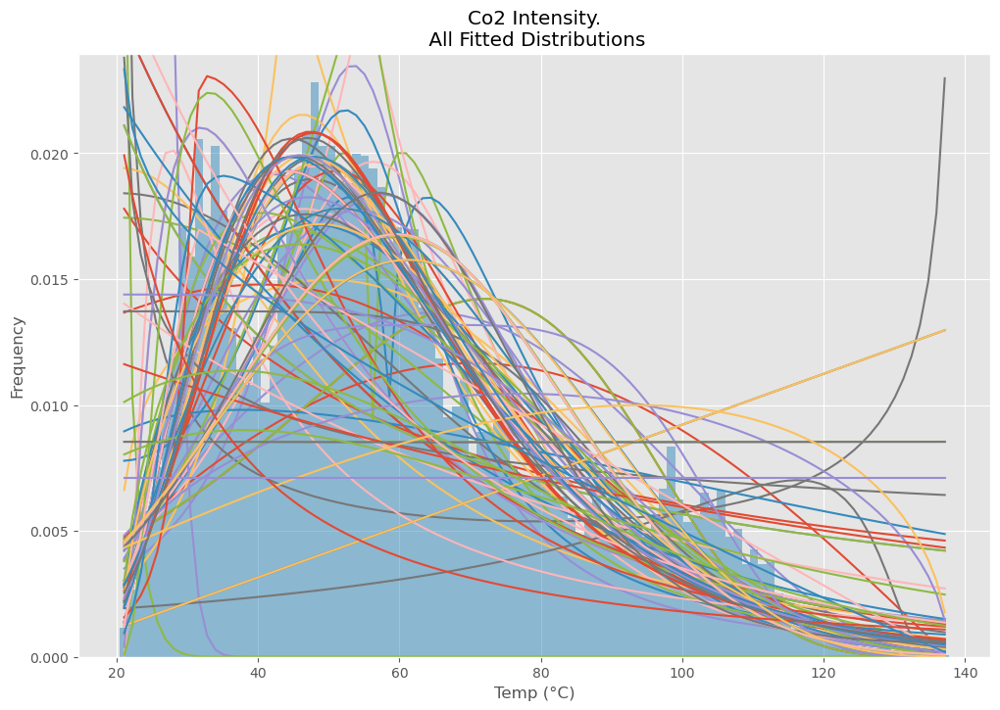

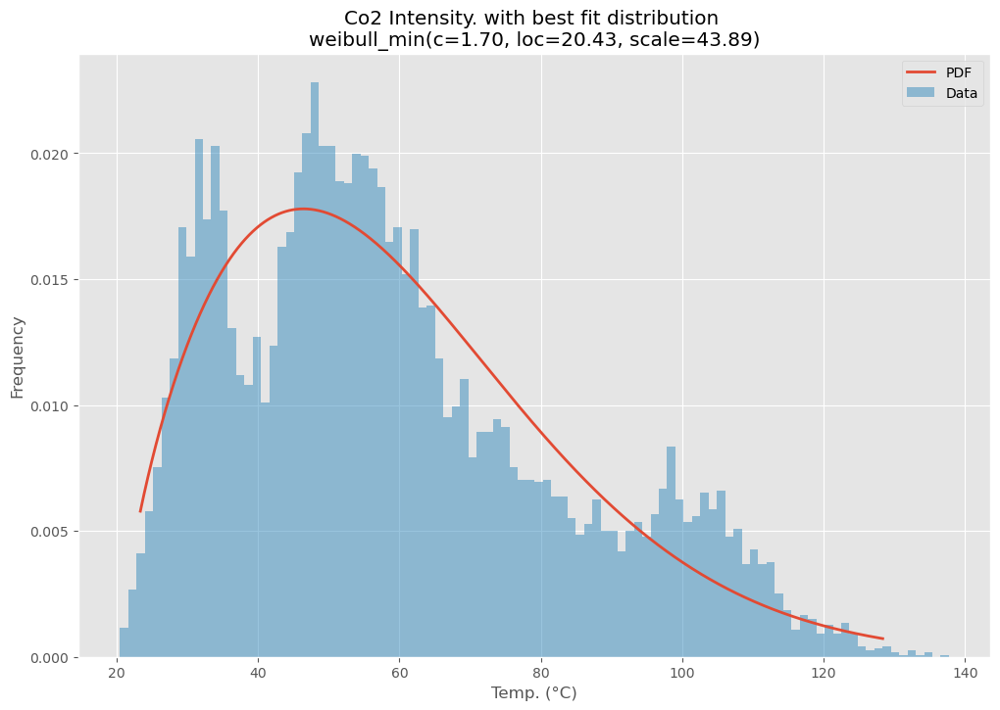

In [131]:
# Stolen from https://stackoverflow.com/questions/6620471/fitting-empirical-distribution-to-theoretical-ones-with-scipy-python

import warnings
import numpy as np
import pandas as pd
import scipy.stats as st
from scipy.stats._continuous_distns import _distn_names
import matplotlib
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor


matplotlib.rcParams['figure.figsize'] = (16.0, 12.0)
matplotlib.style.use('ggplot')

# Create models from data
def best_fit_distribution(data, bins=200, ax=None):
    """Model data by finding best fit distribution to data"""
    # Get histogram of original data
    y, x = np.histogram(data, bins=bins, density=True)
    x = (x + np.roll(x, -1))[:-1] / 2.0

    # Best holders
    best_distributions = []

    # Estimate distribution parameters from data
    def do_fit(task):
        ii, distribution = task
        print("{:>3} / {:<3}: {}".format( ii+1, len(_distn_names), distribution ))

        distribution = getattr(st, distribution)

        # Try to fit the distribution
        try:
            # Ignore warnings from data that can't be fit
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore')
                
                # fit dist to data
                params = distribution.fit(data)

                # Separate parts of parameters
                arg = params[:-2]
                loc = params[-2]
                scale = params[-1]
                
                # Calculate fitted PDF and error with fit in distribution
                pdf = distribution.pdf(x, loc=loc, scale=scale, *arg)
                sse = np.sum(np.power(y - pdf, 2.0))
                
                # if axis pass in add to plot
                try:
                    if ax:
                        pd.Series(pdf, x).plot(ax=ax)
                    
                except Exception:
                    return False

                # identify if this distribution is better
                return (distribution, params, sse)
        
        except Exception:
            return False


    with ThreadPoolExecutor() as executor:
        best_distributions = list(filter(lambda x: x != False,executor.map(do_fit, enumerate([d for d in _distn_names if not d in ['levy_stable', 'studentized_range']]))))


    
    return sorted(best_distributions, key=lambda x:x[2])

def make_pdf(dist, params, size=10000):
    """Generate distributions's Probability Distribution Function """

    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]

    # Get sane start and end points of distribution
    start = dist.ppf(0.01, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.01, loc=loc, scale=scale)
    end = dist.ppf(0.99, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.99, loc=loc, scale=scale)

    # Build PDF and turn into pandas Series
    x = np.linspace(start, end, size)
    y = dist.pdf(x, loc=loc, scale=scale, *arg)
    pdf = pd.Series(y, x)

    return pdf

# Load data from statsmodels datasets
data = co2_intensity["intensity"]

# Plot for comparison
plt.figure(figsize=(12,8))
ax = data.plot(kind='hist', bins=100, density=True, alpha=0.5, color=list(matplotlib.rcParams['axes.prop_cycle'])[1]['color'])

# Save plot limits
dataYLim = ax.get_ylim()

# Find best fit distribution
best_distibutions = best_fit_distribution(data, 100, ax)


# Update plots
ax.set_ylim(dataYLim)
ax.set_title(u'Co2 Intensity.\n All Fitted Distributions')
ax.set_xlabel(u'Temp (°C)')
ax.set_ylabel('Frequency')

for i in range (1):

    best_dist = best_distibutions[i]


    # Make PDF with best params 
    pdf = make_pdf(best_dist[0], best_dist[1])

    # Display
    plt.figure(figsize=(12,8))
    ax = pdf.plot(lw=2, label='PDF', legend=True)
    data.plot(kind='hist', bins=100, density=True, alpha=0.5, label='Data', legend=True, ax=ax)

    param_names = (best_dist[0].shapes + ', loc, scale').split(', ') if best_dist[0].shapes else ['loc', 'scale']
    param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_dist[1])])
    dist_str = '{}({})'.format(best_dist[0].name, param_str)

    ax.set_title(u'Co2 Intensity. with best fit distribution \n' + dist_str)
    ax.set_xlabel(u'Temp. (°C)')
    ax.set_ylabel('Frequency')
